# Data Analysis and Visualization

In [53]:
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# visualization tools
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import folium
from folium.plugins import HeatMap
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

### Reading Data

In [54]:
df=pd.read_csv("data.csv")

In [55]:
df.sample(5)

,Lat,Long,Renk,KM,Yil,Vites,Yakit,Tip,Itis,Beygir,Marka,Model,Fiyat
64206,NaN,NaN,Bej,360000,2001,Manuel,Benzin & LPG,Sedan,Önden Çekiş,125,Honda,Civic,41750
25989,NaN,NaN,Gümüş Gri,110000,2010,Manuel,Benzin,Sedan,Önden Çekiş,124,Chevrolet,Cruze,56500
25193,NaN,NaN,Mavi,215000,2006,Manuel,Benzin,Hatchback 5 kapı,Önden Çekiş,72,Chevrolet,Kalos,23600
90521,NaN,NaN,Beyaz,20000,2012,Manuel,Benzin,Hatchback 5 kapı,Önden Çekiş,140,Opel,Astra,96500
74080,41.02907,28.8363,Beyaz,37000,2017,Yarı Otomatik,Dizel,Sedan,Arkadan İtiş,136,Mercedes - Benz,C Serisi,275000


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155344 entries, 0 to 155343
Data columns (total 13 columns):
Lat       88124 non-null float64
Long      88124 non-null float64
Renk      155344 non-null object
KM        155344 non-null int64
Yil       155344 non-null int64
Vites     155344 non-null object
Yakit     155344 non-null object
Tip       155344 non-null object
Itis      155344 non-null object
Beygir    155344 non-null int64
Marka     155344 non-null object
Model     155344 non-null object
Fiyat     155344 non-null int64
dtypes: float64(2), int64(4), object(7)
memory usage: 15.4+ MB


In [57]:
df.isnull().sum()

Lat       67220
Long      67220
Renk          0
KM            0
Yil           0
Vites         0
Yakit         0
Tip           0
Itis          0
Beygir        0
Marka         0
Model         0
Fiyat         0
dtype: int64

# Missingno - Missing Data

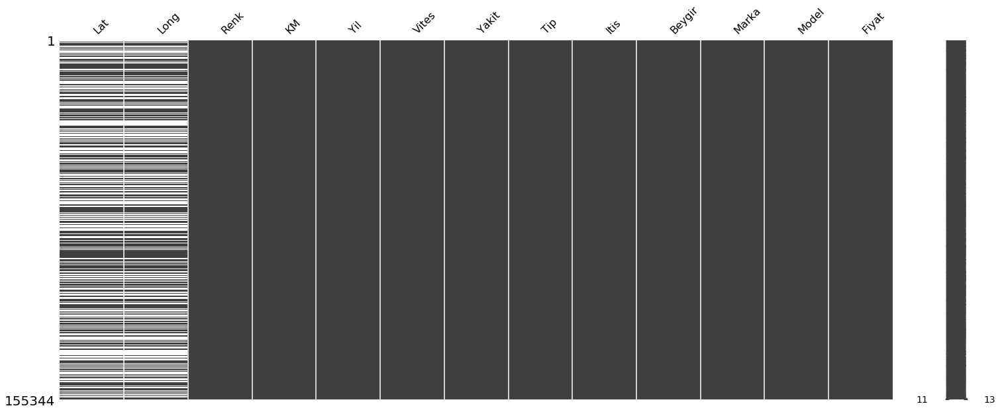

In [58]:
import missingno as msno
msno.matrix(df)
plt.show()

# Seaborn - Heatmap

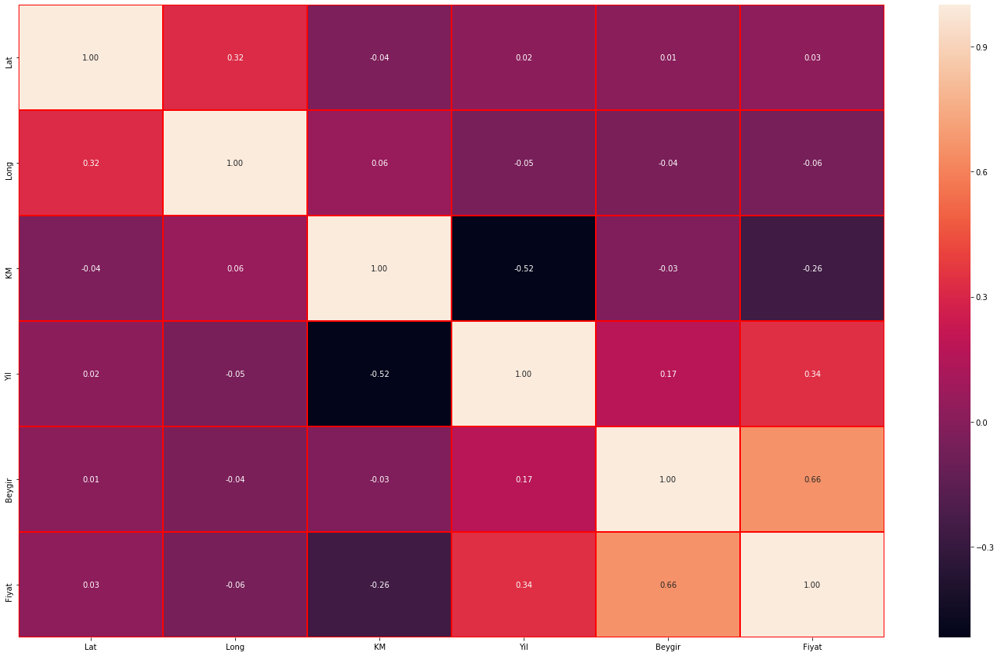

In [59]:
f,ax = plt.subplots(figsize=(25, 15))
sns.heatmap(df.corr(), annot=True, linewidths=1,linecolor="red", fmt= '.2f',ax=ax)
plt.show()

# Seaborn - Bar Plot

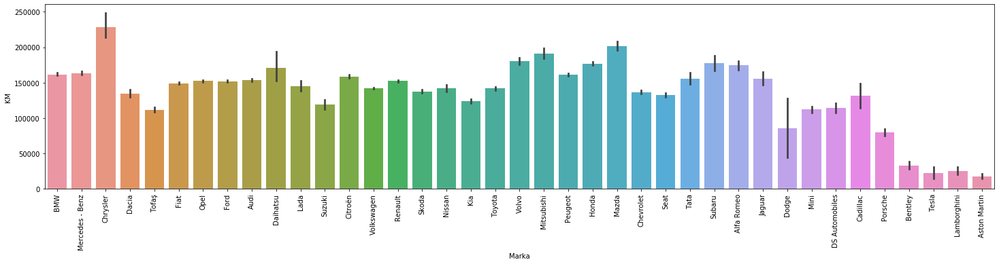

In [60]:
df=df.sort_values(by=['KM'],ascending=False)
plt.figure(figsize=(25,5))
sns.barplot(x=df.Marka, y=df.KM)
plt.xticks(rotation= 90)
plt.xlabel('Marka')
plt.ylabel('KM')
plt.show()

# Plotly - Donut Chart

In [61]:
df.Yakit.unique()

array(['Benzin & LPG', 'Dizel', 'Benzin', 'Hybrid', 'Elektrik'],
      dtype=object)

In [62]:
gasLabels = df[df["Yakit"]=="Benzin"].Renk.value_counts().head(10).index
gasValues = df[df["Yakit"]=="Benzin"].Renk.value_counts().head(10).values
dieselLabels = df[df["Yakit"]=="Dizel"].Renk.value_counts().head(10).index
dieselValues = df[df["Yakit"]=="Dizel"].Renk.value_counts().head(10).values
electricLabels = df[df["Yakit"]=="Elektrik"].Renk.value_counts().head(10).index
electricValues = df[df["Yakit"]=="Elektrik"].Renk.value_counts().head(10).values

from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=3, specs=[[{'type':'domain'}, {'type':'domain'}, {'type':'domain'}]])
fig.add_trace(go.Pie(labels=gasLabels, values=gasValues, name="Benzinli Araç"),
              1, 1)
fig.add_trace(go.Pie(labels=dieselLabels, values=dieselValues, name="Dizel Araç"),
              1, 2)
fig.add_trace(go.Pie(labels=electricLabels, values=electricValues, name="Elektirikli Araç"),
              1, 3)

fig.update_traces(hole=.4, hoverinfo="label+percent+name")

fig.show()

# Plotly - 2D Histogram

In [63]:
x = df.Yakit
y = df.Vites

fig = go.Figure(go.Histogram2d(
        x=x,
        y=y
    ))
fig.show()

# Folium - Map

In [64]:
cars=df[df["Marka"]=="Audi"].iloc[:,0:2]
cars.rename(columns={'Lat':'latitude','Long':'longitude'}, inplace=True)
cars.latitude.fillna(0, inplace = True)
cars.longitude.fillna(0, inplace = True) 

CarMap=folium.Map(location=[39,35],zoom_start=6)
HeatMap(data=cars, radius=16).add_to(CarMap)
CarMap.save('index.html')
CarMap

# Word Cloud

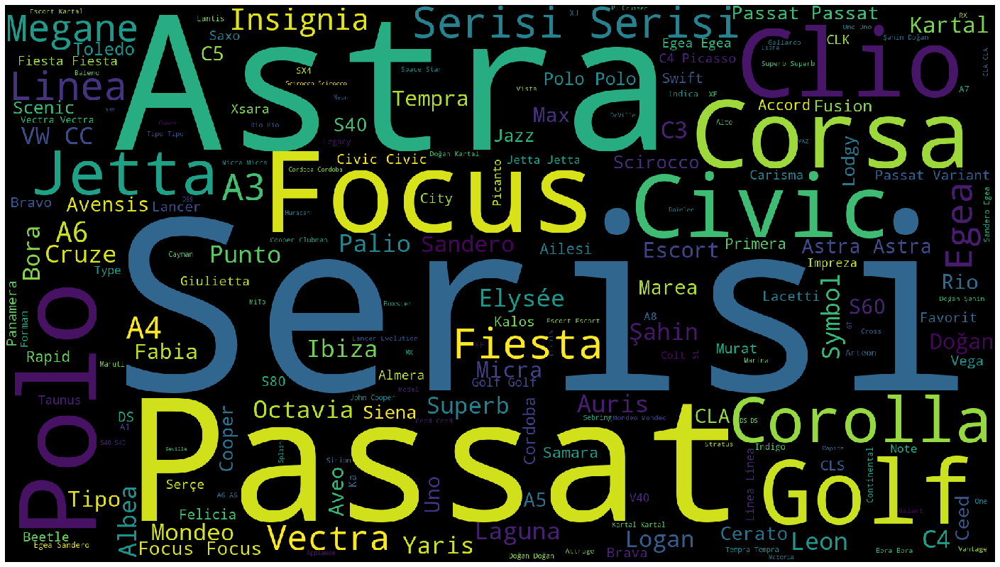

In [65]:
plt.figure(figsize=(25,15))
wordcloud = WordCloud(
                          background_color='black',
                          width=1920,
                          height=1080
                         ).generate(" ".join(df.Model))
plt.imshow(wordcloud)
plt.axis('off')
plt.savefig('graph.png')
plt.show()